In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/dataset/new_data/real_size.csv
/kaggle/input/dataset/new_data/valid/GT_ICM/Blast_PCRM_R14-0324a ICM_Mask.bmp
/kaggle/input/dataset/new_data/valid/GT_ICM/Blast_PCRM_R16-0398A ICM_Mask.bmp
/kaggle/input/dataset/new_data/valid/GT_ICM/Blast_PCRM_1202184 D5 ICM_Mask.bmp
/kaggle/input/dataset/new_data/valid/GT_ICM/Blast_PCRM_R13-0019 ICM_Mask.bmp
/kaggle/input/dataset/new_data/valid/GT_ICM/Blast_PCRM_R12-0315 ICM_Mask.bmp
/kaggle/input/dataset/new_data/valid/GT_ICM/Blast_PCRM_R13-0494a ICM_Mask.bmp
/kaggle/input/dataset/new_data/valid/GT_ICM/Blast_PCRM_R14-0118 ICM_Mask.bmp
/kaggle/input/dataset/new_data/valid/GT_ICM/Blast_PCRM_R16-0330A ICM_Mask.bmp
/kaggle/input/dataset/new_data/valid/GT_ICM/Blast_PCRM_R13-0163 ICM_Mask.bmp
/kaggle/input/dataset/new_data/valid/GT_ICM/Blast_PCRM_R14-0323 ICM_Mask.bmp
/kaggle/input/dataset/new_data/valid/GT_ICM/Blast_PCRM_R13-0065A ICM_Mask.bmp
/kaggle/input/dataset/new_data/valid/GT_ICM/Blast_PCRM_R13-0074B ICM_Mask.bmp
/kaggle/input/dataset/n

In [4]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
import tensorflow.keras.backend as K
from glob import glob
import os
from tensorflow.keras.metrics import Recall, Precision, Accuracy, IoU


In [5]:
" Seeding """
np.random.seed(42)
tf.random.set_seed(42)


In [6]:
SIZE=256
def read_image_tf(path):
    path = path.decode()
    x = cv2.imread(path, cv2.IMREAD_COLOR)
    x = cv2.resize(x, (SIZE, SIZE))
    x = x / 255.0
    return x.astype(np.float32)

def read_mask_tf(path):
    path = path.decode()
    y = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    y = cv2.resize(y, (SIZE, SIZE))
    y[y != 0] = 255
    y = y / 255.0
    y = (y > 0.5).astype(np.float32)
    y = np.expand_dims(y, axis=-1)
    return y

def tf_parse(x_path, y_path):
    def _parse(x_path, y_path):
        x = read_image_tf(x_path)
        y = read_mask_tf(y_path)
        return x, y

    x, y = tf.numpy_function(_parse, [x_path, y_path], [tf.float32, tf.float32])
    x.set_shape([SIZE, SIZE, 3])
    y.set_shape([SIZE, SIZE, 1])
    return x, y

def tf_dataset(x_paths, y_paths, batch_size=16, shuffle=True):
    dataset = tf.data.Dataset.from_tensor_slices((x_paths, y_paths))
    if shuffle:
        dataset = dataset.shuffle(buffer_size=1000)
    dataset = dataset.map(tf_parse, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    return dataset


In [7]:
def iou(y_true, y_pred):
    y_true = tf.round(y_true)
    y_pred = tf.round(y_pred)
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection
    iou = (intersection + 1e-15) / (union + 1e-15)
    return iou


smooth = 1e-15
def dice_coef(y_true, y_pred):
    y_true = tf.keras.layers.Flatten()(y_true)
    y_pred = tf.keras.layers.Flatten()(y_pred)
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)

def dice_loss(y_true, y_pred):
    return 1.0 - dice_coef(y_true, y_pred)

In [8]:
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger, ReduceLROnPlateau, EarlyStopping, TensorBoard
callbacks = [
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=10, min_lr=1e-7, verbose=1),
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=40, restore_best_weights=False),
    TensorBoard()

]

In [9]:

import tensorflow as tf
from tensorflow.keras import layers, Model, regularizers
weight_decay=1e-8
def conv_block(x, filters, dropout=False):
    x = layers.Conv2D(filters, (3, 3), padding="same", kernel_initializer='he_normal')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    x = layers.Conv2D(filters, (3, 3), padding="same", kernel_initializer='he_normal')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    if dropout:
        x = layers.Dropout(0.5)(x)

    return x


def encoder_block(x, filters):
    c = conv_block(x, filters)
    p = layers.MaxPooling2D((2, 2))(c)
    return c, p

def decoder_block(x, skip, filters):
    x = layers.Conv2DTranspose(filters, (2, 2), strides=2, padding="same")(x)
    x = layers.Concatenate()([x, skip])
    x = conv_block(x, filters)
    return x

def build_unet(input_shape):
    inputs = tf.keras.Input(input_shape)

    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    # Apply dropout in encoder 4
    s4 = conv_block(p3, 512, dropout=True)
    p4 = layers.MaxPooling2D((2, 2))(s4)

    # Apply dropout in bottleneck
    b1 = conv_block(p4, 1024, dropout=True)

    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    outputs = layers.Conv2D(1, 1, padding="same", activation="sigmoid")(d4)

    return Model(inputs, outputs)

In [10]:
train_y = '/kaggle/input/dataset/new_data/train/GT_TE'
train_x = '/kaggle/input/dataset/new_data/train/images'
test_y = '/kaggle/input/dataset/new_data/test/GT_TE'
test_x = '/kaggle/input/dataset/new_data/test/images'
valid_y = '/kaggle/input/dataset/new_data/valid/GT_TE'
valid_x = '/kaggle/input/dataset/new_data/valid/images'

train_images = sorted(glob(os.path.join(train_x, "*.bmp")))
train_masks  = sorted(glob(os.path.join(train_y, "*.bmp")))

test_images = sorted(glob(os.path.join(test_x, "*.bmp")))
test_masks  = sorted(glob(os.path.join(test_y, "*.bmp")))

valid_images = sorted(glob(os.path.join(valid_x, "*.bmp")))
valid_masks  = sorted(glob(os.path.join(valid_y, "*.bmp")))

# Create datasets
train_dataset = tf_dataset(train_images, train_masks, batch_size=16)
test_dataset  = tf_dataset(test_images, test_masks, batch_size=16,shuffle=False)
valid_dataset = tf_dataset(valid_images, valid_masks, batch_size=16, shuffle=False)
print("Number of training samples:", len(train_images))
print("Number of validation samples:", len(valid_images))
print("Number of testing samples:", len(test_images))

metrics = [dice_coef, iou, 'accuracy', Recall(), Precision()]

I0000 00:00:1748643782.472645      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1748643782.473326      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Number of training samples: 995
Number of validation samples: 25
Number of testing samples: 25


In [11]:
def channel_attention(x, ratio=2, name_prefix="attention"):
    channel = x.shape[-1]
    shared_dense_one = layers.Dense(channel // ratio, activation='relu', kernel_initializer='he_normal', name=f"{name_prefix}_dense1")
    shared_dense_two = layers.Dense(channel, kernel_initializer='he_normal', name=f"{name_prefix}_dense2")

    avg_pool = layers.GlobalAveragePooling2D()(x)
    avg_pool = layers.Reshape((1, 1, channel))(avg_pool)
    avg_out = shared_dense_two(shared_dense_one(avg_pool))

    max_pool = layers.GlobalMaxPooling2D()(x)
    max_pool = layers.Reshape((1, 1, channel))(max_pool)
    max_out = shared_dense_two(shared_dense_one(max_pool))

    out = layers.Add(name=f"{name_prefix}_add")([avg_out, max_out])
    attention = layers.Activation('sigmoid', name=f"{name_prefix}_sigmoid")(out)

    scaled = layers.Multiply(name=f"{name_prefix}_multiply")([x, attention])
    out = layers.Add(name=f"{name_prefix}_final_add")([scaled, x])

    return out, attention, scaled


In [32]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf  # Ensure tf is imported

# Get a test sample (image, mask) from the validation dataset
sample = next(iter(valid_dataset))
sample_img = sample[0][0]  # (H, W, C)
sample_mask = sample[1][0]  # (H, W, 1) or (H, W)

# Expand dims for prediction
sample_img_exp = tf.expand_dims(sample_img, axis=0)  # (1, H, W, C)

In [13]:

import tensorflow as tf
from tensorflow.keras import layers

def dual_pathway_spatial_attention(x_l, x_h, out_channels,name_prefix="attention"):
    """
    Dual-pathway AG block: spatial attention for decoder stage s.

    Args:
        x_h: high-level feature map (upsampled from decoder)
        x_l: low-level feature map (from encoder)
        out_channels: number of output channels after ΦC conv (e.g., 64, 32, 16)

    Returns:
        Calibrated feature map after dual-pathway attention.
    """
    def single_path_attention(x_l, x_h):
    # Combine high-level and low-level features
      theta_x_l = layers.Conv2D(out_channels, (1, 1), padding='same')(x_l)
      phi_x_h = layers.Conv2D(out_channels, (1, 1), padding='same')(x_h)
      add = layers.Add()([theta_x_l, phi_x_h])
      act = layers.Activation('relu')(add)

    # Spatial Attention using both average and max pooling
      avg_pool = layers.Lambda(lambda x: tf.reduce_mean(x, axis=-1, keepdims=True))(act)
      max_pool = layers.Lambda(lambda x: tf.reduce_max(x, axis=-1, keepdims=True))(act)
      concat_pool = layers.Concatenate(axis=-1)([avg_pool, max_pool])  # Shape: (H, W, 2)

      attention = layers.Conv2D(1, (7, 7), padding='same', activation='sigmoid')(concat_pool)
      out = layers.Multiply()([x_l, attention])  # x_l · α

      return out


    # First AG pathway
    ag1 = single_path_attention(x_l, x_h)

    # Second AG pathway (can be made slightly different if needed)
    ag2 = single_path_attention(x_l, x_h)

    # Concatenate both pathways (along channel axis)
    concat = layers.Concatenate(axis=-1)([ag1, ag2])

    # Apply ΦC (1x1 conv + BN + ReLU)
    conv = layers.Conv2D(out_channels, (1, 1), padding='same' , use_bias=False)(concat)
    bn = layers.BatchNormalization()(conv)
    out = layers.Activation('relu',name=f"{name_prefix}_outskip")(bn)

    return out


In [14]:
from tensorflow.keras import layers, backend as K
import tensorflow as tf

def SA1_non_local_attention(x, inter_channels=64,name_prefix="attention"):
    input_channels = x.shape[-1]
    H, W = x.shape[1], x.shape[2]  # Capture symbolic H and W

    # Step 1: Reduce channels
    x_0   = layers.Conv2D(inter_channels, (1, 1), padding='same')(x)
    x_00  = layers.Conv2D(inter_channels, (1, 1), padding='same')(x)
    x_000 = layers.Conv2D(inter_channels, (1, 1), padding='same')(x)

    # Step 2: Flatten (B, H, W, C) → (B, H*W, C)
    def reshape_for_attention(y):
        return tf.reshape(y, (tf.shape(y)[0], -1, inter_channels))  # (B, HW, C)

    x_theta = layers.Lambda(reshape_for_attention, output_shape=(None, None, inter_channels))(x_0)
    x_phi   = layers.Lambda(reshape_for_attention, output_shape=(None, None, inter_channels))(x_00)
    x_g     = layers.Lambda(reshape_for_attention, output_shape=(None, None, inter_channels))(x_000)

    # Step 3: Attention weights
    attention_scores = layers.Lambda(
        lambda inputs: tf.matmul(inputs[0], inputs[1], transpose_b=True),
        output_shape=(None, None, None)
    )([x_theta, x_phi])

    attention = layers.Activation('softmax')(attention_scores)

    # Step 4: Apply attention: α · g
    x_att = layers.Lambda(
        lambda inputs: tf.matmul(inputs[0], inputs[1]),
        output_shape=(None, None, inter_channels)
    )([attention, x_g])

    # Step 5: Reshape back to (B, H, W, C)
    def reshape_back(y):
        return tf.reshape(y, (-1, H, W, inter_channels))

    x_att_reshaped = layers.Lambda(reshape_back, output_shape=(H, W, inter_channels))(x_att)

    # Step 6: Project back to input channels
    x_out = layers.Conv2D(input_channels, (1, 1), padding='same', use_bias=False)(x_att_reshaped)
    x_out = layers.BatchNormalization()(x_out)
    final=layers.Add(name=f"{name_prefix}_final_add")([x_out, x])
    return final,x_out


In [15]:
def decoder_blockspc(x,skip, filters,name_prefix="decoder"):
    x = conv_block(x, filters*2)
    x = layers.Conv2DTranspose(filters, (2, 2), strides=2, padding="same")(x)
    skipatt=dual_pathway_spatial_attention(skip,x,filters,name_prefix=f"{name_prefix}_dualattention")
    x = layers.Concatenate(axis=-1)([x, skipatt])
    x = conv_block(x, filters)
    x,vec,ch=channel_attention(x,name_prefix=f"{name_prefix}_channelattention")
    return x,vec,ch,skipatt


In [16]:
def decoder_blocknlbc(x, skip, filters,name_prefix="decoder"):
    x = layers.Conv2DTranspose(filters, (2, 2), strides=2, padding="same")(x)
    x = layers.Concatenate()([x, skip])
    x,f = SA1_non_local_attention(x,name_prefix=f"{name_prefix}_nlbattention")
    x = conv_block(x, filters)
    x,vec,ch=channel_attention(x,name_prefix=f"{name_prefix}_channelattention")
    return x,vec,ch,f


In [17]:
def scale_attention_module(features,name_prefix="attention"):
    """
    Paper-faithful Scale Attention Module (CA-Net) with symbolic shape fix.
    Args:
        features: list of decoder feature maps from 4 different scales (d1 to d4)
    Returns:
        Final enhanced feature map (B, H, W, 4)
    """
    H, W = features[3].shape[1], features[3].shape[2]  # symbolic-safe shape

    # 1. Resize all feature maps to same shape
    resized = [layers.Resizing(H, W, interpolation='bilinear')(f) for f in features]

    # 2. Compress to 1 channel per scale
    compressed = [layers.Conv2D(1, (1, 1), padding='same')(f) for f in resized]

    # 3. Concatenate → F̂ (B, H, W, 4)
    F_hat = layers.Concatenate(axis=-1)(compressed)
    shared_dense_one = layers.Dense(4//2 , activation='relu', kernel_initializer='he_normal')
    shared_dense_two = layers.Dense(4, kernel_initializer='he_normal')
    # 4. Scale-wise attention γ
    gap = layers.GlobalAveragePooling2D()(F_hat)
    gmp = layers.GlobalMaxPooling2D()(F_hat)
    gap = layers.Reshape((1, 1, 4))(gap)
    gmp = layers.Reshape((1, 1, 4))(gmp)
    gap = shared_dense_two(shared_dense_one(gap))
    gmp = shared_dense_two(shared_dense_one(gmp))
    gamma = layers.Add()([gap, gmp])
    gamma = layers.Activation('sigmoid')(gamma)  # (B, 1, 1, 4)

    F_gamma = layers.Multiply()([F_hat, gamma])  # (B, H, W, 4)

    # 5. Pixel-wise scale attention γ*
    x = layers.Conv2D(4, (3, 3), padding='same', activation='relu')(F_gamma)
    gamma_star = layers.Conv2D(4, (1, 1), padding='same', activation='sigmoid')(x)


    # 6. Final residual + fused output
    out = layers.Add()([
        layers.Multiply()([F_gamma, gamma_star]),
        layers.Multiply()([F_hat, gamma]),
        F_hat
    ])
    x = layers.Activation("relu")(out)
    x = layers.Conv2D(4, (3, 3), padding="same", kernel_initializer='he_normal')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu",name=f"{name_prefix}_final")(x)

    return x


In [18]:
def build_unettotale(input_shape):
    inputs = tf.keras.Input(input_shape)

    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4 = conv_block(p3, 512, dropout=True)
    p4 = layers.MaxPooling2D((2, 2))(s4)

    # Apply dropout in bottleneck
    b1 = conv_block(p4, 1024, dropout=True)
    d1,vec,ch1,SA1 = decoder_blocknlbc(b1, s4, 512,name_prefix="decoder1")
    d2,vec,ch2,SA2 = decoder_blockspc(d1, s3, 256,name_prefix="decoder2")
    d3,vec,ch3,SA3 = decoder_blockspc(d2, s2, 128,name_prefix="decoder3")
    d4,vec,ch4,SA4 = decoder_blockspc(d3, s1, 64,name_prefix="decoder4")
    la_output = scale_attention_module([d1, d2, d3, d4],name_prefix="scaler")  # returns enhanced feature map

    outputs = layers.Conv2D(1, 1, padding="same", activation="sigmoid",name="segmentation_output")(la_output)

    return Model(inputs=inputs, outputs=outputs)

In [19]:
# Now build and compile model like you did
input_shape = ((SIZE, SIZE, 3))
modelte_totale = build_unettotale(input_shape)
modelte_totale.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4, weight_decay=1e-8),
    loss=dice_loss,
    metrics=metrics
)

In [20]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

class FinalFeatureMapCallback(tf.keras.callbacks.Callback):
    def __init__(self, feature_extractor, val_data):
        super(FinalFeatureMapCallback, self).__init__()
        self.feature_extractor = feature_extractor
        self.val_data = val_data

    def on_train_end(self, logs=None):
        # Get the last image from the last batch of val_data
        last_image = None
        for batch in self.val_data:
            last_image = batch[0]  # (inputs, labels)

        if last_image is None:
            print("Validation data is empty.")
            return

        image = last_image[-1:]  # shape (1, H, W, C)

        # Get feature maps
        feature_maps = self.feature_extractor.predict(image)

        # Plot the first channel of each decoder output
        fig, axes = plt.subplots(1, len(feature_maps), figsize=(20, 5))
        for i, fmap in enumerate(feature_maps):
            fmap = np.squeeze(fmap)  # (H, W, C)
            axes[i].imshow(fmap[:, :, 0], cmap='jet')  # first channel
            axes[i].set_title(f'Decoder {i + 1}')
            axes[i].axis('off')

        plt.suptitle('Final Feature Maps (last val image, last epoch)')
        plt.show()


In [22]:
layer_names = [
    "decoder1_nlbattention_final_add",
    "decoder1_channelattention_final_add",
    "decoder2_dualattention_outskip",
    "decoder2_channelattention_final_add",
    "decoder3_dualattention_outskip",
    "decoder3_channelattention_final_add",
    "decoder4_dualattention_outskip",
    "decoder4_channelattention_final_add",
    "scaler_final"
]
# Create a new model that outputs the attention layers
feature_extractor = tf.keras.Model(inputs=modelte_totale.input,
                                   outputs=[modelte_totale.get_layer(name).output for name in layer_names])



In [23]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

class FinalFeatureMapCallback(tf.keras.callbacks.Callback):
    def __init__(self, feature_extractor, val_data, freq=5):
        super(FinalFeatureMapCallback, self).__init__()
        self.feature_extractor = feature_extractor
        self.val_data = val_data
        self.freq = freq

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % self.freq != 0:
            return  # Skip this epoch

        # Get the last image from the last batch of val_data
        last_image = None
        for batch in self.val_data:
            last_image = batch[0]  # (inputs, labels)

        if last_image is None:
            print("Validation data is empty.")
            return

        image = last_image[-1:]  # shape (1, H, W, C)

        # Get feature maps
        feature_maps = self.feature_extractor.predict(image)

        # Plot the first channel of each decoder output
        fig, axes = plt.subplots(1, len(feature_maps), figsize=(20, 5))
        for i, fmap in enumerate(feature_maps):
            fmap = np.squeeze(fmap)  # (H, W, C)
            axes[i].imshow(fmap[:, :, 0], cmap='jet')  # first channel
            axes[i].set_title(f'Decoder {i + 1}')
            axes[i].axis('off')

        plt.suptitle(f'Feature Maps - Epoch {epoch + 1}')
        plt.tight_layout()
        plt.show()


In [24]:
feature_map_callback = FinalFeatureMapCallback(feature_extractor, val_data=valid_dataset,freq=5)


In [25]:
class SaveEveryNEpochs(tf.keras.callbacks.Callback):
    def __init__(self, save_freq=5, filepath='model_epoch_{epoch:03d}.h5'):
        super(SaveEveryNEpochs, self).__init__()
        self.save_freq = save_freq
        self.filepath = filepath

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % self.save_freq == 0:
            file_path = self.filepath.format(epoch=epoch + 1)
            self.model.save(file_path)
            print(f'\n✅ Model saved at {file_path}')


Epoch 1/200


I0000 00:00:1748644074.585155     107 service.cc:148] XLA service 0x7b4e20002710 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1748644074.586003     107 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1748644074.586024     107 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1748644078.912960     107 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-05-30 22:28:06.748603: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng12{k11=0} for conv (f32[16,128,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[16,128,128,128]{3,2,1,0}, f32[128,128,3,3]{3,2,1,0}, f32[128]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest

62/63 ━━━━━━━━━━━━━━━━━━━━ 2s 3s/step - accuracy: 0.7178 - dice_coef: 0.2583 - iou: 0.2814 - loss: 0.7417 - precision: 0.2836 - recall: 0.9076

E0000 00:00:1748644375.879273     107 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1748644376.104960     107 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1748644383.972422     107 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1748644384.290549     107 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1748644391.306273     107 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:0

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.7184 - dice_coef: 0.2585 - iou: 0.2820 - loss: 0.7415 - precision: 0.2841 - recall: 0.9084

E0000 00:00:1748644451.886575     108 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1748644452.163768     108 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


63/63 ━━━━━━━━━━━━━━━━━━━━ 430s 4s/step - accuracy: 0.7189 - dice_coef: 0.2588 - iou: 0.2825 - loss: 0.7412 - precision: 0.2847 - recall: 0.9091 - val_accuracy: 0.6694 - val_dice_coef: 0.2176 - val_iou: 0.2612 - val_loss: 0.7809 - val_precision: 0.2616 - val_recall: 0.9578 - learning_rate: 1.0000e-04
Epoch 2/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.8096 - dice_coef: 0.2950 - iou: 0.3922 - loss: 0.7050 - precision: 0.3867 - recall: 0.9608 - val_accuracy: 0.3774 - val_dice_coef: 0.2103 - val_iou: 0.1358 - val_loss: 0.7882 - val_precision: 0.1408 - val_recall: 0.8181 - learning_rate: 1.0000e-04
Epoch 3/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9077 - dice_coef: 0.3058 - iou: 0.5437 - loss: 0.6942 - precision: 0.5690 - recall: 0.9222 - val_accuracy: 0.5046 - val_dice_coef: 0.2186 - val_iou: 0.0794 - val_loss: 0.7797 - val_precision: 0.0887 - val_recall: 0.3359 - learning_rate: 1.0000e-04
Epoch 4/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9256

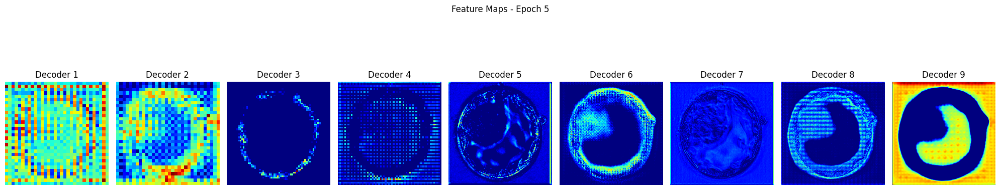

63/63 ━━━━━━━━━━━━━━━━━━━━ 174s 3s/step - accuracy: 0.9350 - dice_coef: 0.3195 - iou: 0.6251 - loss: 0.6805 - precision: 0.6648 - recall: 0.9124 - val_accuracy: 0.8134 - val_dice_coef: 0.3013 - val_iou: 0.3851 - val_loss: 0.6958 - val_precision: 0.3906 - val_recall: 0.9816 - learning_rate: 1.0000e-04
Epoch 6/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9401 - dice_coef: 0.3247 - iou: 0.6446 - loss: 0.6753 - precision: 0.6842 - recall: 0.9161 - val_accuracy: 0.9092 - val_dice_coef: 0.3164 - val_iou: 0.5386 - val_loss: 0.6821 - val_precision: 0.5807 - val_recall: 0.8833 - learning_rate: 1.0000e-04
Epoch 7/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9455 - dice_coef: 0.3302 - iou: 0.6648 - loss: 0.6698 - precision: 0.7079 - recall: 0.9150 - val_accuracy: 0.9230 - val_dice_coef: 0.3306 - val_iou: 0.5788 - val_loss: 0.6683 - val_precision: 0.6282 - val_recall: 0.8829 - learning_rate: 1.0000e-04
Epoch 8/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9512

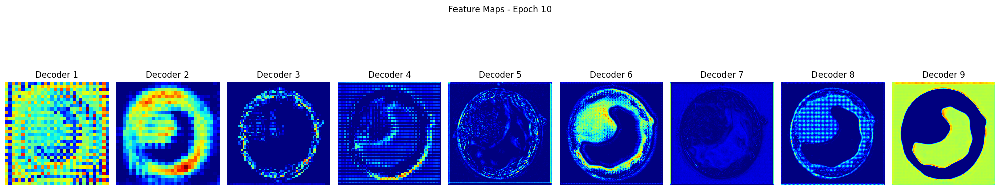

63/63 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.9545 - dice_coef: 0.3524 - iou: 0.7074 - loss: 0.6476 - precision: 0.7538 - recall: 0.9188 - val_accuracy: 0.9474 - val_dice_coef: 0.3251 - val_iou: 0.6517 - val_loss: 0.6736 - val_precision: 0.7663 - val_recall: 0.8101 - learning_rate: 1.0000e-04
Epoch 11/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9567 - dice_coef: 0.3571 - iou: 0.7151 - loss: 0.6429 - precision: 0.7640 - recall: 0.9169 - val_accuracy: 0.9545 - val_dice_coef: 0.3396 - val_iou: 0.6789 - val_loss: 0.6598 - val_precision: 0.8196 - val_recall: 0.7972 - learning_rate: 1.0000e-04
Epoch 12/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9609 - dice_coef: 0.3689 - iou: 0.7405 - loss: 0.6311 - precision: 0.7890 - recall: 0.9225 - val_accuracy: 0.9566 - val_dice_coef: 0.3595 - val_iou: 0.7099 - val_loss: 0.6388 - val_precision: 0.7826 - val_recall: 0.8859 - learning_rate: 1.0000e-04
Epoch 13/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9

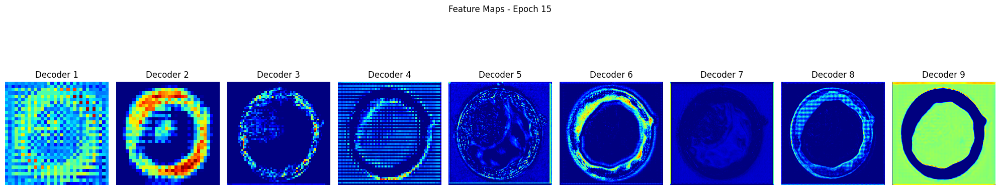

63/63 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.9633 - dice_coef: 0.3842 - iou: 0.7479 - loss: 0.6158 - precision: 0.7982 - recall: 0.9211 - val_accuracy: 0.9537 - val_dice_coef: 0.3665 - val_iou: 0.6635 - val_loss: 0.6316 - val_precision: 0.8406 - val_recall: 0.7596 - learning_rate: 1.0000e-04
Epoch 16/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9640 - dice_coef: 0.3921 - iou: 0.7505 - loss: 0.6079 - precision: 0.8065 - recall: 0.9151 - val_accuracy: 0.9532 - val_dice_coef: 0.4067 - val_iou: 0.7032 - val_loss: 0.5918 - val_precision: 0.7529 - val_recall: 0.9102 - learning_rate: 1.0000e-04
Epoch 17/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 160s 3s/step - accuracy: 0.9664 - dice_coef: 0.3998 - iou: 0.7654 - loss: 0.6002 - precision: 0.8126 - recall: 0.9292 - val_accuracy: 0.9492 - val_dice_coef: 0.3676 - val_iou: 0.6457 - val_loss: 0.6329 - val_precision: 0.8146 - val_recall: 0.7485 - learning_rate: 1.0000e-04
Epoch 18/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 160s 3s/step - accuracy: 0.9

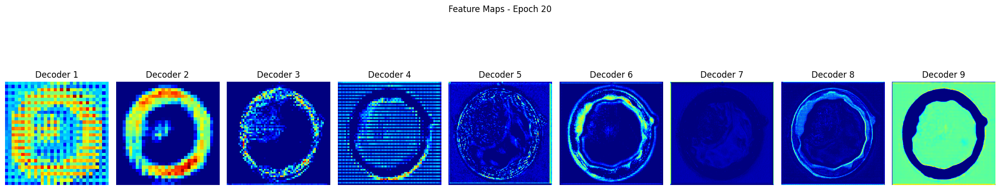

63/63 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.9688 - dice_coef: 0.4252 - iou: 0.7804 - loss: 0.5748 - precision: 0.8320 - recall: 0.9257 - val_accuracy: 0.9531 - val_dice_coef: 0.4119 - val_iou: 0.6571 - val_loss: 0.5874 - val_precision: 0.8431 - val_recall: 0.7495 - learning_rate: 1.0000e-04
Epoch 21/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 160s 3s/step - accuracy: 0.9689 - dice_coef: 0.4308 - iou: 0.7783 - loss: 0.5692 - precision: 0.8330 - recall: 0.9218 - val_accuracy: 0.9499 - val_dice_coef: 0.4151 - val_iou: 0.6854 - val_loss: 0.5846 - val_precision: 0.7403 - val_recall: 0.8986 - learning_rate: 1.0000e-04
Epoch 22/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9693 - dice_coef: 0.4399 - iou: 0.7832 - loss: 0.5601 - precision: 0.8305 - recall: 0.9316 - val_accuracy: 0.9571 - val_dice_coef: 0.4383 - val_iou: 0.7176 - val_loss: 0.5596 - val_precision: 0.7803 - val_recall: 0.8964 - learning_rate: 1.0000e-04
Epoch 23/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9

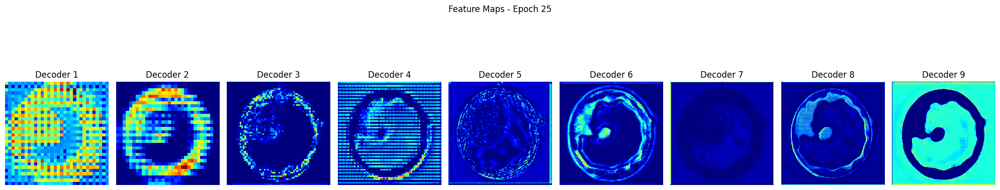

63/63 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.9736 - dice_coef: 0.4681 - iou: 0.8097 - loss: 0.5319 - precision: 0.8568 - recall: 0.9358 - val_accuracy: 0.9577 - val_dice_coef: 0.4499 - val_iou: 0.7048 - val_loss: 0.5480 - val_precision: 0.8103 - val_recall: 0.8469 - learning_rate: 1.0000e-04
Epoch 26/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9735 - dice_coef: 0.4743 - iou: 0.8073 - loss: 0.5257 - precision: 0.8555 - recall: 0.9344 - val_accuracy: 0.9551 - val_dice_coef: 0.4522 - val_iou: 0.6869 - val_loss: 0.5458 - val_precision: 0.8062 - val_recall: 0.8258 - learning_rate: 1.0000e-04
Epoch 27/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9728 - dice_coef: 0.4803 - iou: 0.8019 - loss: 0.5196 - precision: 0.8504 - recall: 0.9331 - val_accuracy: 0.9534 - val_dice_coef: 0.4570 - val_iou: 0.6976 - val_loss: 0.5422 - val_precision: 0.7538 - val_recall: 0.9095 - learning_rate: 1.0000e-04
Epoch 28/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9

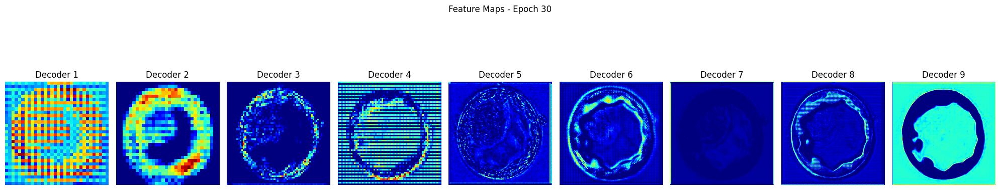

63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9740 - dice_coef: 0.5096 - iou: 0.8117 - loss: 0.4904 - precision: 0.8575 - recall: 0.9382 - val_accuracy: 0.9581 - val_dice_coef: 0.4791 - val_iou: 0.7140 - val_loss: 0.5210 - val_precision: 0.8044 - val_recall: 0.8611 - learning_rate: 1.0000e-04
Epoch 31/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9745 - dice_coef: 0.5136 - iou: 0.8122 - loss: 0.4864 - precision: 0.8575 - recall: 0.9383 - val_accuracy: 0.9566 - val_dice_coef: 0.5287 - val_iou: 0.7136 - val_loss: 0.4706 - val_precision: 0.7760 - val_recall: 0.8988 - learning_rate: 1.0000e-04
Epoch 32/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9769 - dice_coef: 0.5322 - iou: 0.8308 - loss: 0.4678 - precision: 0.8734 - recall: 0.9444 - val_accuracy: 0.9582 - val_dice_coef: 0.5215 - val_iou: 0.7038 - val_loss: 0.4771 - val_precision: 0.8241 - val_recall: 0.8293 - learning_rate: 1.0000e-04
Epoch 33/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9

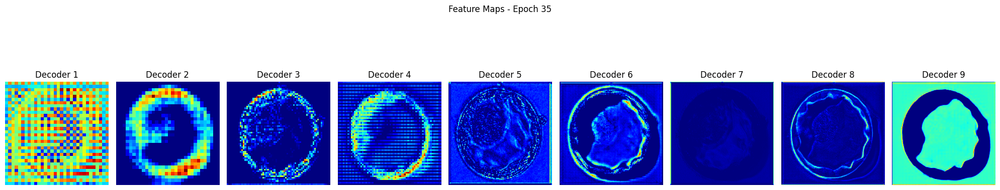

63/63 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.9782 - dice_coef: 0.5622 - iou: 0.8383 - loss: 0.4378 - precision: 0.8798 - recall: 0.9464 - val_accuracy: 0.9507 - val_dice_coef: 0.5434 - val_iou: 0.6996 - val_loss: 0.4566 - val_precision: 0.7273 - val_recall: 0.9448 - learning_rate: 1.0000e-04
Epoch 36/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9768 - dice_coef: 0.5679 - iou: 0.8284 - loss: 0.4321 - precision: 0.8704 - recall: 0.9448 - val_accuracy: 0.9601 - val_dice_coef: 0.5553 - val_iou: 0.7313 - val_loss: 0.4430 - val_precision: 0.7956 - val_recall: 0.8995 - learning_rate: 1.0000e-04
Epoch 37/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9789 - dice_coef: 0.5779 - iou: 0.8402 - loss: 0.4221 - precision: 0.8801 - recall: 0.9487 - val_accuracy: 0.9606 - val_dice_coef: 0.5508 - val_iou: 0.7187 - val_loss: 0.4470 - val_precision: 0.8309 - val_recall: 0.8441 - learning_rate: 1.0000e-04
Epoch 38/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9

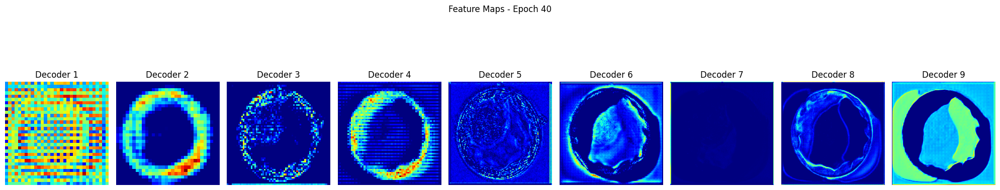

63/63 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.9804 - dice_coef: 0.6181 - iou: 0.8523 - loss: 0.3819 - precision: 0.8918 - recall: 0.9505 - val_accuracy: 0.9569 - val_dice_coef: 0.5392 - val_iou: 0.7234 - val_loss: 0.4593 - val_precision: 0.7637 - val_recall: 0.9290 - learning_rate: 1.0000e-04
Epoch 41/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9775 - dice_coef: 0.6250 - iou: 0.8336 - loss: 0.3750 - precision: 0.8769 - recall: 0.9434 - val_accuracy: 0.9554 - val_dice_coef: 0.5579 - val_iou: 0.6961 - val_loss: 0.4410 - val_precision: 0.7980 - val_recall: 0.8434 - learning_rate: 1.0000e-04
Epoch 42/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9817 - dice_coef: 0.6425 - iou: 0.8608 - loss: 0.3575 - precision: 0.8988 - recall: 0.9533 - val_accuracy: 0.9536 - val_dice_coef: 0.5650 - val_iou: 0.6802 - val_loss: 0.4334 - val_precision: 0.7988 - val_recall: 0.8218 - learning_rate: 1.0000e-04
Epoch 43/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9

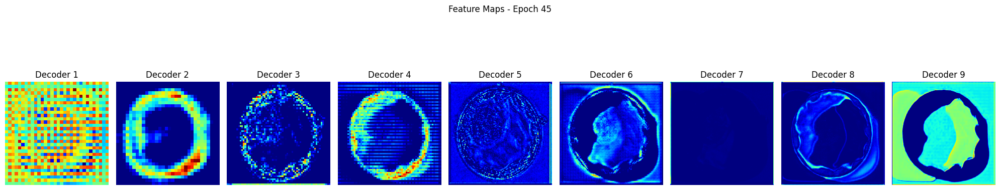

63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9835 - dice_coef: 0.6719 - iou: 0.8736 - loss: 0.3281 - precision: 0.9111 - recall: 0.9552 - val_accuracy: 0.9652 - val_dice_coef: 0.6240 - val_iou: 0.7518 - val_loss: 0.3739 - val_precision: 0.8377 - val_recall: 0.8819 - learning_rate: 1.0000e-04
Epoch 46/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9839 - dice_coef: 0.6775 - iou: 0.8743 - loss: 0.3225 - precision: 0.9103 - recall: 0.9568 - val_accuracy: 0.9601 - val_dice_coef: 0.6111 - val_iou: 0.7067 - val_loss: 0.3859 - val_precision: 0.8470 - val_recall: 0.8161 - learning_rate: 1.0000e-04
Epoch 47/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9836 - dice_coef: 0.6875 - iou: 0.8743 - loss: 0.3124 - precision: 0.9125 - recall: 0.9544 - val_accuracy: 0.9387 - val_dice_coef: 0.5301 - val_iou: 0.5544 - val_loss: 0.4680 - val_precision: 0.8125 - val_recall: 0.6384 - learning_rate: 1.0000e-04
Epoch 48/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9

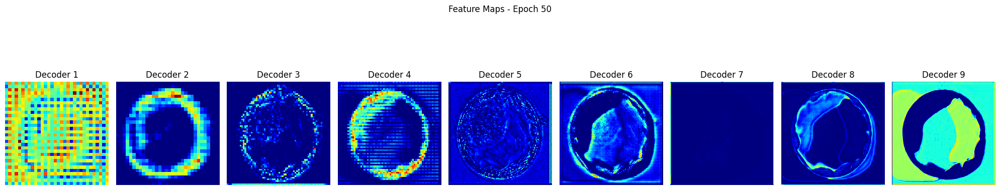

63/63 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.9840 - dice_coef: 0.7084 - iou: 0.8765 - loss: 0.2916 - precision: 0.9127 - recall: 0.9564 - val_accuracy: 0.9635 - val_dice_coef: 0.6476 - val_iou: 0.7358 - val_loss: 0.3509 - val_precision: 0.8507 - val_recall: 0.8450 - learning_rate: 1.0000e-04
Epoch 51/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9856 - dice_coef: 0.7214 - iou: 0.8892 - loss: 0.2786 - precision: 0.9203 - recall: 0.9634 - val_accuracy: 0.9605 - val_dice_coef: 0.6540 - val_iou: 0.7263 - val_loss: 0.3458 - val_precision: 0.8212 - val_recall: 0.8592 - learning_rate: 1.0000e-04
Epoch 52/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9847 - dice_coef: 0.7246 - iou: 0.8819 - loss: 0.2754 - precision: 0.9175 - recall: 0.9578 - val_accuracy: 0.9622 - val_dice_coef: 0.6526 - val_iou: 0.7215 - val_loss: 0.3458 - val_precision: 0.8616 - val_recall: 0.8175 - learning_rate: 1.0000e-04
Epoch 53/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9

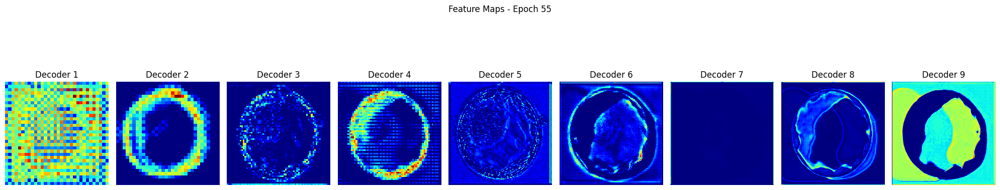

63/63 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.9867 - dice_coef: 0.7480 - iou: 0.8955 - loss: 0.2520 - precision: 0.9277 - recall: 0.9630 - val_accuracy: 0.9622 - val_dice_coef: 0.6640 - val_iou: 0.7231 - val_loss: 0.3345 - val_precision: 0.8584 - val_recall: 0.8215 - learning_rate: 1.0000e-04
Epoch 56/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9859 - dice_coef: 0.7511 - iou: 0.8891 - loss: 0.2489 - precision: 0.9238 - recall: 0.9596 - val_accuracy: 0.9632 - val_dice_coef: 0.6976 - val_iou: 0.7436 - val_loss: 0.3013 - val_precision: 0.8230 - val_recall: 0.8848 - learning_rate: 1.0000e-04
Epoch 57/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9875 - dice_coef: 0.7607 - iou: 0.9006 - loss: 0.2393 - precision: 0.9300 - recall: 0.9663 - val_accuracy: 0.9607 - val_dice_coef: 0.6718 - val_iou: 0.7123 - val_loss: 0.3275 - val_precision: 0.8599 - val_recall: 0.8048 - learning_rate: 1.0000e-04
Epoch 58/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9

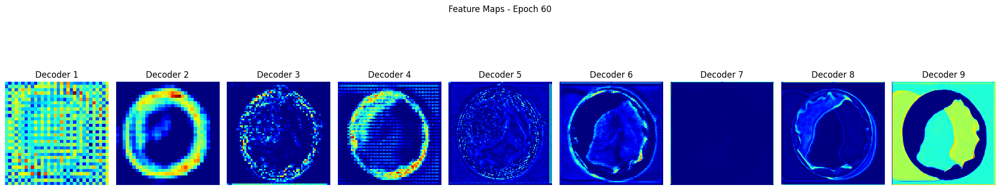

63/63 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.9885 - dice_coef: 0.7799 - iou: 0.9075 - loss: 0.2201 - precision: 0.9377 - recall: 0.9659 - val_accuracy: 0.9623 - val_dice_coef: 0.7075 - val_iou: 0.7328 - val_loss: 0.2894 - val_precision: 0.8210 - val_recall: 0.8782 - learning_rate: 1.0000e-04
Epoch 61/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9889 - dice_coef: 0.7884 - iou: 0.9116 - loss: 0.2116 - precision: 0.9391 - recall: 0.9690 - val_accuracy: 0.9626 - val_dice_coef: 0.7086 - val_iou: 0.7286 - val_loss: 0.2900 - val_precision: 0.8461 - val_recall: 0.8422 - learning_rate: 1.0000e-04
Epoch 62/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9891 - dice_coef: 0.7943 - iou: 0.9136 - loss: 0.2058 - precision: 0.9415 - recall: 0.9687 - val_accuracy: 0.9617 - val_dice_coef: 0.7218 - val_iou: 0.7375 - val_loss: 0.2770 - val_precision: 0.8062 - val_recall: 0.8972 - learning_rate: 1.0000e-04
Epoch 63/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9

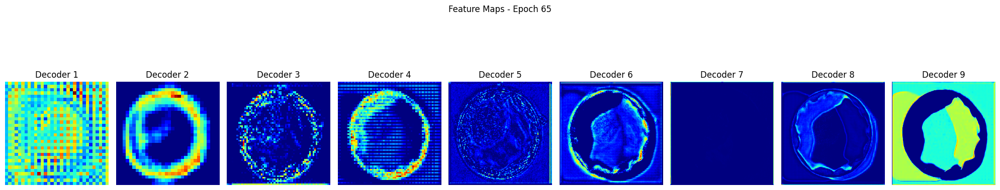

63/63 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.9882 - dice_coef: 0.8047 - iou: 0.9059 - loss: 0.1953 - precision: 0.9382 - recall: 0.9633 - val_accuracy: 0.9598 - val_dice_coef: 0.7201 - val_iou: 0.7186 - val_loss: 0.2794 - val_precision: 0.8213 - val_recall: 0.8510 - learning_rate: 1.0000e-04
Epoch 66/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 160s 3s/step - accuracy: 0.9893 - dice_coef: 0.8130 - iou: 0.9145 - loss: 0.1870 - precision: 0.9421 - recall: 0.9691 - val_accuracy: 0.9617 - val_dice_coef: 0.7266 - val_iou: 0.7315 - val_loss: 0.2743 - val_precision: 0.8346 - val_recall: 0.8506 - learning_rate: 1.0000e-04
Epoch 67/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9900 - dice_coef: 0.8185 - iou: 0.9192 - loss: 0.1815 - precision: 0.9464 - recall: 0.9698 - val_accuracy: 0.9627 - val_dice_coef: 0.7384 - val_iou: 0.7381 - val_loss: 0.2609 - val_precision: 0.8267 - val_recall: 0.8732 - learning_rate: 1.0000e-04
Epoch 68/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 160s 3s/step - accuracy: 0.9

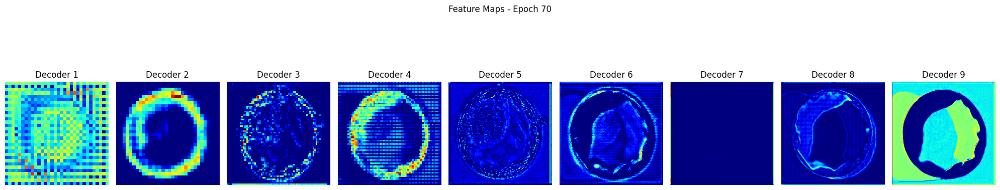

63/63 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.9907 - dice_coef: 0.8340 - iou: 0.9251 - loss: 0.1660 - precision: 0.9509 - recall: 0.9718 - val_accuracy: 0.9625 - val_dice_coef: 0.7336 - val_iou: 0.7254 - val_loss: 0.2629 - val_precision: 0.8447 - val_recall: 0.8435 - learning_rate: 1.0000e-04
Epoch 71/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9904 - dice_coef: 0.8375 - iou: 0.9233 - loss: 0.1625 - precision: 0.9497 - recall: 0.9710 - val_accuracy: 0.9591 - val_dice_coef: 0.7203 - val_iou: 0.6985 - val_loss: 0.2790 - val_precision: 0.8600 - val_recall: 0.7882 - learning_rate: 1.0000e-04
Epoch 72/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9906 - dice_coef: 0.8421 - iou: 0.9247 - loss: 0.1579 - precision: 0.9518 - recall: 0.9704 - val_accuracy: 0.9623 - val_dice_coef: 0.7522 - val_iou: 0.7326 - val_loss: 0.2466 - val_precision: 0.8296 - val_recall: 0.8638 - learning_rate: 1.0000e-04
Epoch 73/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9

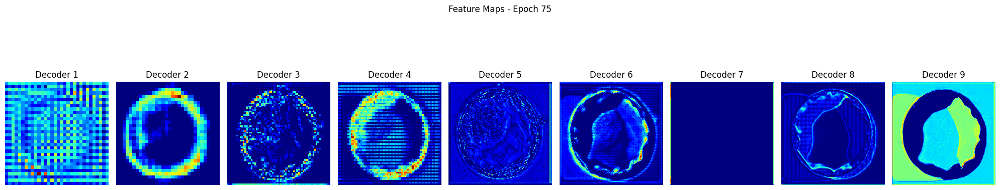

63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9914 - dice_coef: 0.8550 - iou: 0.9309 - loss: 0.1450 - precision: 0.9560 - recall: 0.9727 - val_accuracy: 0.9620 - val_dice_coef: 0.7398 - val_iou: 0.7138 - val_loss: 0.2596 - val_precision: 0.8847 - val_recall: 0.7867 - learning_rate: 1.0000e-04
Epoch 76/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9908 - dice_coef: 0.8555 - iou: 0.9260 - loss: 0.1445 - precision: 0.9543 - recall: 0.9692 - val_accuracy: 0.9613 - val_dice_coef: 0.7458 - val_iou: 0.7137 - val_loss: 0.2517 - val_precision: 0.8573 - val_recall: 0.8140 - learning_rate: 1.0000e-04
Epoch 77/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9909 - dice_coef: 0.8575 - iou: 0.9251 - loss: 0.1425 - precision: 0.9531 - recall: 0.9695 - val_accuracy: 0.9622 - val_dice_coef: 0.7557 - val_iou: 0.7251 - val_loss: 0.2428 - val_precision: 0.8489 - val_recall: 0.8345 - learning_rate: 1.0000e-04
Epoch 78/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9

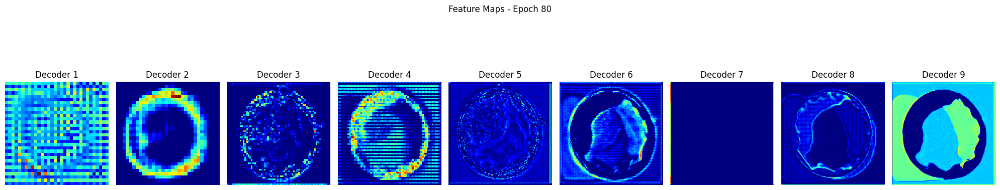

63/63 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.9917 - dice_coef: 0.8709 - iou: 0.9326 - loss: 0.1291 - precision: 0.9571 - recall: 0.9734 - val_accuracy: 0.9607 - val_dice_coef: 0.7492 - val_iou: 0.7097 - val_loss: 0.2486 - val_precision: 0.8582 - val_recall: 0.8072 - learning_rate: 1.0000e-04
Epoch 81/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9922 - dice_coef: 0.8760 - iou: 0.9373 - loss: 0.1240 - precision: 0.9606 - recall: 0.9749 - val_accuracy: 0.9619 - val_dice_coef: 0.7639 - val_iou: 0.7208 - val_loss: 0.2347 - val_precision: 0.8540 - val_recall: 0.8240 - learning_rate: 1.0000e-04
Epoch 82/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9925 - dice_coef: 0.8789 - iou: 0.9390 - loss: 0.1211 - precision: 0.9613 - recall: 0.9760 - val_accuracy: 0.9633 - val_dice_coef: 0.7777 - val_iou: 0.7389 - val_loss: 0.2204 - val_precision: 0.8302 - val_recall: 0.8738 - learning_rate: 1.0000e-04
Epoch 83/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9

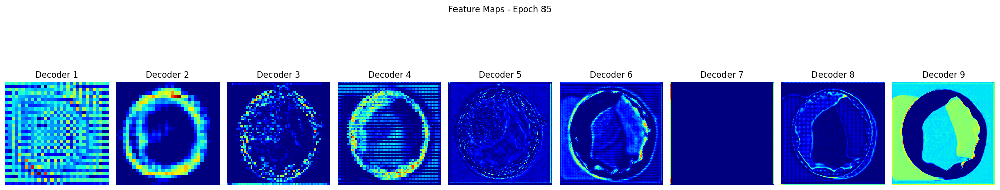

63/63 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.9925 - dice_coef: 0.8866 - iou: 0.9386 - loss: 0.1134 - precision: 0.9623 - recall: 0.9747 - val_accuracy: 0.9609 - val_dice_coef: 0.7680 - val_iou: 0.7161 - val_loss: 0.2317 - val_precision: 0.8513 - val_recall: 0.8181 - learning_rate: 1.0000e-04
Epoch 86/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 160s 3s/step - accuracy: 0.9927 - dice_coef: 0.8889 - iou: 0.9397 - loss: 0.1111 - precision: 0.9621 - recall: 0.9761 - val_accuracy: 0.9625 - val_dice_coef: 0.7822 - val_iou: 0.7327 - val_loss: 0.2160 - val_precision: 0.8313 - val_recall: 0.8641 - learning_rate: 1.0000e-04
Epoch 87/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9925 - dice_coef: 0.8906 - iou: 0.9379 - loss: 0.1094 - precision: 0.9616 - recall: 0.9746 - val_accuracy: 0.9640 - val_dice_coef: 0.7832 - val_iou: 0.7337 - val_loss: 0.2154 - val_precision: 0.8647 - val_recall: 0.8309 - learning_rate: 1.0000e-04
Epoch 88/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9

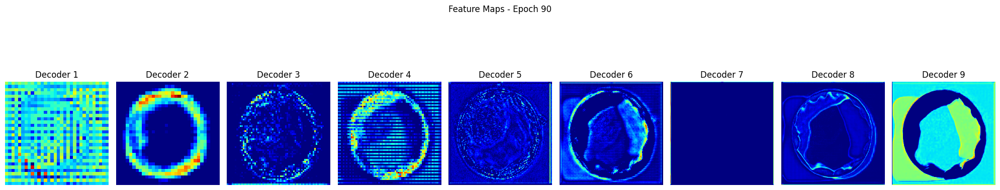

63/63 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.9932 - dice_coef: 0.9006 - iou: 0.9445 - loss: 0.0994 - precision: 0.9661 - recall: 0.9772 - val_accuracy: 0.9611 - val_dice_coef: 0.7753 - val_iou: 0.7125 - val_loss: 0.2234 - val_precision: 0.8612 - val_recall: 0.8071 - learning_rate: 1.0000e-04
Epoch 91/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9925 - dice_coef: 0.8997 - iou: 0.9389 - loss: 0.1002 - precision: 0.9631 - recall: 0.9741 - val_accuracy: 0.9503 - val_dice_coef: 0.7349 - val_iou: 0.6486 - val_loss: 0.2660 - val_precision: 0.8191 - val_recall: 0.7540 - learning_rate: 1.0000e-04
Epoch 92/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9870 - dice_coef: 0.8815 - iou: 0.8966 - loss: 0.1185 - precision: 0.9381 - recall: 0.9533 - val_accuracy: 0.9629 - val_dice_coef: 0.7896 - val_iou: 0.7340 - val_loss: 0.2113 - val_precision: 0.8507 - val_recall: 0.8392 - learning_rate: 1.0000e-04
Epoch 93/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 160s 3s/step - accuracy: 0.9

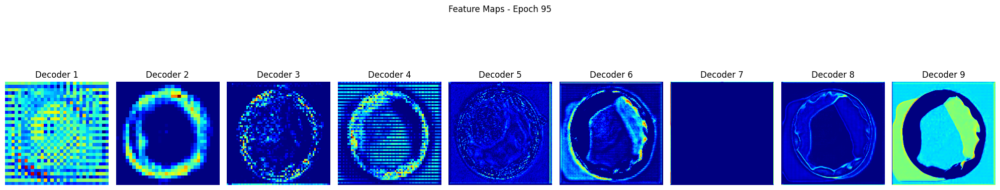

63/63 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.9935 - dice_coef: 0.9118 - iou: 0.9472 - loss: 0.0882 - precision: 0.9681 - recall: 0.9779 - val_accuracy: 0.9607 - val_dice_coef: 0.7807 - val_iou: 0.7093 - val_loss: 0.2179 - val_precision: 0.8607 - val_recall: 0.8033 - learning_rate: 1.0000e-04
Epoch 96/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9936 - dice_coef: 0.9130 - iou: 0.9472 - loss: 0.0870 - precision: 0.9695 - recall: 0.9765 - val_accuracy: 0.9606 - val_dice_coef: 0.7878 - val_iou: 0.7151 - val_loss: 0.2107 - val_precision: 0.8401 - val_recall: 0.8307 - learning_rate: 1.0000e-04
Epoch 97/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9926 - dice_coef: 0.9117 - iou: 0.9396 - loss: 0.0883 - precision: 0.9629 - recall: 0.9750 - val_accuracy: 0.9613 - val_dice_coef: 0.7894 - val_iou: 0.7168 - val_loss: 0.2081 - val_precision: 0.8454 - val_recall: 0.8299 - learning_rate: 1.0000e-04
Epoch 98/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9

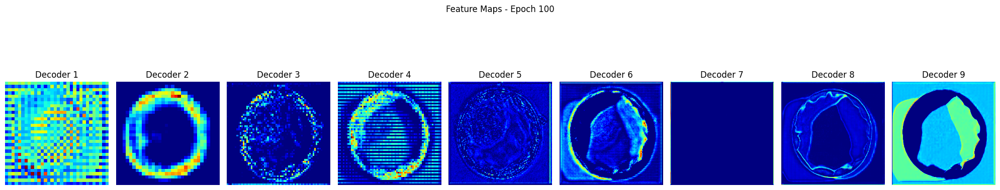

63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9942 - dice_coef: 0.9227 - iou: 0.9530 - loss: 0.0773 - precision: 0.9726 - recall: 0.9794 - val_accuracy: 0.9630 - val_dice_coef: 0.7982 - val_iou: 0.7272 - val_loss: 0.2012 - val_precision: 0.8657 - val_recall: 0.8200 - learning_rate: 1.0000e-04
Epoch 101/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9940 - dice_coef: 0.9227 - iou: 0.9503 - loss: 0.0773 - precision: 0.9720 - recall: 0.9772 - val_accuracy: 0.9627 - val_dice_coef: 0.7981 - val_iou: 0.7245 - val_loss: 0.2007 - val_precision: 0.8627 - val_recall: 0.8209 - learning_rate: 1.0000e-04
Epoch 102/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9942 - dice_coef: 0.9251 - iou: 0.9522 - loss: 0.0749 - precision: 0.9726 - recall: 0.9787 - val_accuracy: 0.9605 - val_dice_coef: 0.7931 - val_iou: 0.7129 - val_loss: 0.2066 - val_precision: 0.8510 - val_recall: 0.8147 - learning_rate: 1.0000e-04
Epoch 103/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 

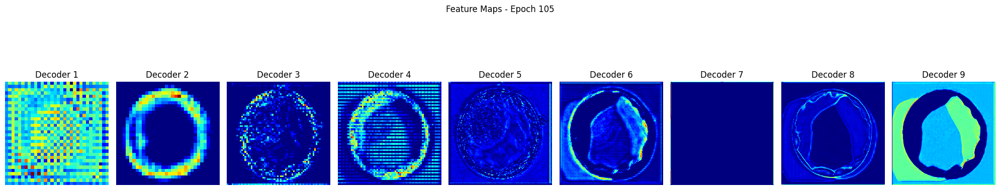

63/63 ━━━━━━━━━━━━━━━━━━━━ 163s 3s/step - accuracy: 0.9946 - dice_coef: 0.9313 - iou: 0.9557 - loss: 0.0687 - precision: 0.9748 - recall: 0.9801 - val_accuracy: 0.9632 - val_dice_coef: 0.8042 - val_iou: 0.7256 - val_loss: 0.1944 - val_precision: 0.8699 - val_recall: 0.8162 - learning_rate: 1.0000e-04
Epoch 106/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9942 - dice_coef: 0.9306 - iou: 0.9520 - loss: 0.0694 - precision: 0.9735 - recall: 0.9774 - val_accuracy: 0.9544 - val_dice_coef: 0.7595 - val_iou: 0.6594 - val_loss: 0.2391 - val_precision: 0.8625 - val_recall: 0.7389 - learning_rate: 1.0000e-04
Epoch 107/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9937 - dice_coef: 0.9306 - iou: 0.9487 - loss: 0.0694 - precision: 0.9700 - recall: 0.9776 - val_accuracy: 0.9565 - val_dice_coef: 0.7986 - val_iou: 0.7076 - val_loss: 0.2017 - val_precision: 0.7891 - val_recall: 0.8718 - learning_rate: 1.0000e-04
Epoch 108/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 160s 3s/step - accuracy: 

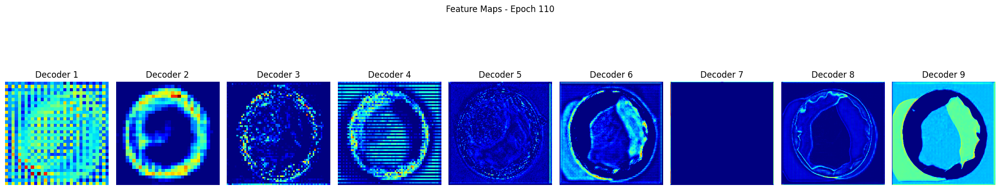

63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9936 - dice_coef: 0.9335 - iou: 0.9476 - loss: 0.0665 - precision: 0.9707 - recall: 0.9757 - val_accuracy: 0.9626 - val_dice_coef: 0.8163 - val_iou: 0.7355 - val_loss: 0.1838 - val_precision: 0.8336 - val_recall: 0.8610 - learning_rate: 1.0000e-04
Epoch 111/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9942 - dice_coef: 0.9370 - iou: 0.9526 - loss: 0.0630 - precision: 0.9723 - recall: 0.9793 - val_accuracy: 0.9619 - val_dice_coef: 0.8101 - val_iou: 0.7251 - val_loss: 0.1904 - val_precision: 0.8507 - val_recall: 0.8289 - learning_rate: 1.0000e-04
Epoch 112/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9945 - dice_coef: 0.9389 - iou: 0.9548 - loss: 0.0611 - precision: 0.9746 - recall: 0.9794 - val_accuracy: 0.9621 - val_dice_coef: 0.8087 - val_iou: 0.7227 - val_loss: 0.1917 - val_precision: 0.8621 - val_recall: 0.8157 - learning_rate: 1.0000e-04
Epoch 113/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 

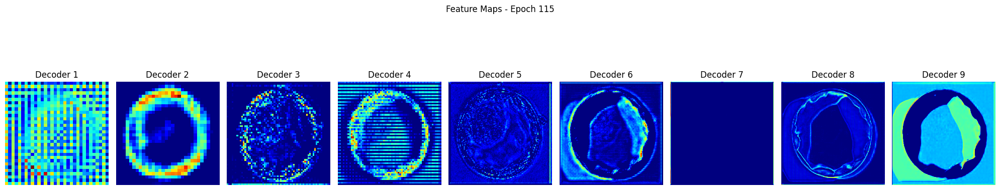

63/63 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.9948 - dice_coef: 0.9426 - iou: 0.9564 - loss: 0.0574 - precision: 0.9747 - recall: 0.9810 - val_accuracy: 0.9634 - val_dice_coef: 0.8185 - val_iou: 0.7338 - val_loss: 0.1814 - val_precision: 0.8557 - val_recall: 0.8371 - learning_rate: 1.0000e-04
Epoch 116/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9950 - dice_coef: 0.9449 - iou: 0.9587 - loss: 0.0551 - precision: 0.9766 - recall: 0.9813 - val_accuracy: 0.9626 - val_dice_coef: 0.8189 - val_iou: 0.7311 - val_loss: 0.1797 - val_precision: 0.8387 - val_recall: 0.8532 - learning_rate: 1.0000e-04
Epoch 117/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9949 - dice_coef: 0.9454 - iou: 0.9575 - loss: 0.0546 - precision: 0.9756 - recall: 0.9811 - val_accuracy: 0.9618 - val_dice_coef: 0.8116 - val_iou: 0.7201 - val_loss: 0.1878 - val_precision: 0.8564 - val_recall: 0.8198 - learning_rate: 1.0000e-04
Epoch 118/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 

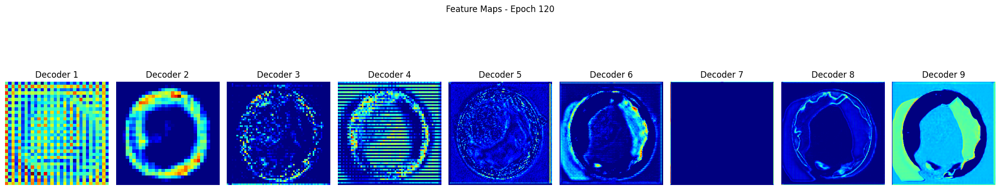

63/63 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.9950 - dice_coef: 0.9492 - iou: 0.9595 - loss: 0.0508 - precision: 0.9775 - recall: 0.9813 - val_accuracy: 0.9454 - val_dice_coef: 0.7257 - val_iou: 0.5981 - val_loss: 0.2790 - val_precision: 0.8562 - val_recall: 0.6566 - learning_rate: 1.0000e-04
Epoch 121/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9901 - dice_coef: 0.9299 - iou: 0.9206 - loss: 0.0701 - precision: 0.9515 - recall: 0.9654 - val_accuracy: 0.9618 - val_dice_coef: 0.8239 - val_iou: 0.7330 - val_loss: 0.1749 - val_precision: 0.8180 - val_recall: 0.8782 - learning_rate: 1.0000e-04
Epoch 122/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9939 - dice_coef: 0.9459 - iou: 0.9500 - loss: 0.0542 - precision: 0.9719 - recall: 0.9769 - val_accuracy: 0.9622 - val_dice_coef: 0.8141 - val_iou: 0.7184 - val_loss: 0.1827 - val_precision: 0.8589 - val_recall: 0.8209 - learning_rate: 1.0000e-04
Epoch 123/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 160s 3s/step - accuracy: 

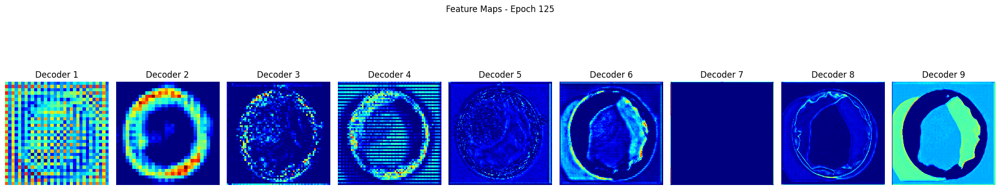

63/63 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.9953 - dice_coef: 0.9535 - iou: 0.9606 - loss: 0.0465 - precision: 0.9773 - recall: 0.9827 - val_accuracy: 0.9639 - val_dice_coef: 0.8262 - val_iou: 0.7359 - val_loss: 0.1727 - val_precision: 0.8541 - val_recall: 0.8438 - learning_rate: 1.0000e-04
Epoch 126/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9953 - dice_coef: 0.9544 - iou: 0.9610 - loss: 0.0456 - precision: 0.9786 - recall: 0.9818 - val_accuracy: 0.9635 - val_dice_coef: 0.8254 - val_iou: 0.7318 - val_loss: 0.1729 - val_precision: 0.8556 - val_recall: 0.8383 - learning_rate: 1.0000e-04
Epoch 127/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9954 - dice_coef: 0.9556 - iou: 0.9618 - loss: 0.0444 - precision: 0.9784 - recall: 0.9827 - val_accuracy: 0.9633 - val_dice_coef: 0.8263 - val_iou: 0.7322 - val_loss: 0.1729 - val_precision: 0.8552 - val_recall: 0.8371 - learning_rate: 1.0000e-04
Epoch 128/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 

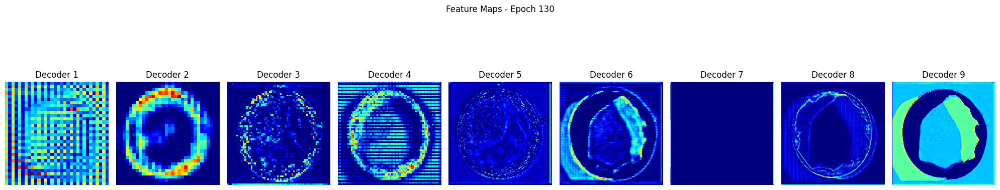

63/63 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.9951 - dice_coef: 0.9569 - iou: 0.9600 - loss: 0.0431 - precision: 0.9778 - recall: 0.9815 - val_accuracy: 0.9618 - val_dice_coef: 0.8273 - val_iou: 0.7306 - val_loss: 0.1705 - val_precision: 0.8199 - val_recall: 0.8753 - learning_rate: 1.0000e-04
Epoch 131/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9916 - dice_coef: 0.9427 - iou: 0.9312 - loss: 0.0573 - precision: 0.9605 - recall: 0.9685 - val_accuracy: 0.9625 - val_dice_coef: 0.8335 - val_iou: 0.7398 - val_loss: 0.1669 - val_precision: 0.8203 - val_recall: 0.8817 - learning_rate: 1.0000e-04
Epoch 132/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 160s 3s/step - accuracy: 0.9945 - dice_coef: 0.9557 - iou: 0.9552 - loss: 0.0443 - precision: 0.9742 - recall: 0.9801 - val_accuracy: 0.9625 - val_dice_coef: 0.8209 - val_iou: 0.7211 - val_loss: 0.1765 - val_precision: 0.8603 - val_recall: 0.8218 - learning_rate: 1.0000e-04
Epoch 133/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 

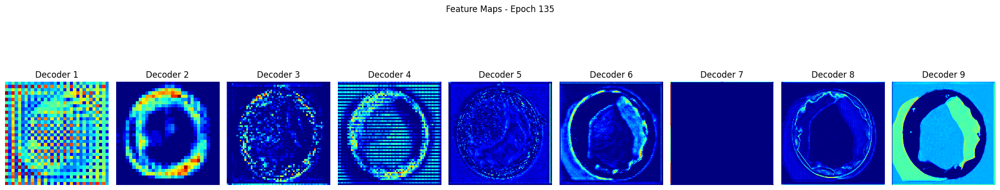

63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9951 - dice_coef: 0.9592 - iou: 0.9591 - loss: 0.0408 - precision: 0.9767 - recall: 0.9817 - val_accuracy: 0.9641 - val_dice_coef: 0.8358 - val_iou: 0.7410 - val_loss: 0.1635 - val_precision: 0.8453 - val_recall: 0.8585 - learning_rate: 1.0000e-04
Epoch 136/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9955 - dice_coef: 0.9614 - iou: 0.9626 - loss: 0.0386 - precision: 0.9786 - recall: 0.9835 - val_accuracy: 0.9632 - val_dice_coef: 0.8276 - val_iou: 0.7279 - val_loss: 0.1703 - val_precision: 0.8580 - val_recall: 0.8319 - learning_rate: 1.0000e-04
Epoch 137/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9957 - dice_coef: 0.9627 - iou: 0.9639 - loss: 0.0373 - precision: 0.9801 - recall: 0.9832 - val_accuracy: 0.9633 - val_dice_coef: 0.8284 - val_iou: 0.7288 - val_loss: 0.1704 - val_precision: 0.8608 - val_recall: 0.8288 - learning_rate: 1.0000e-04
Epoch 138/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 

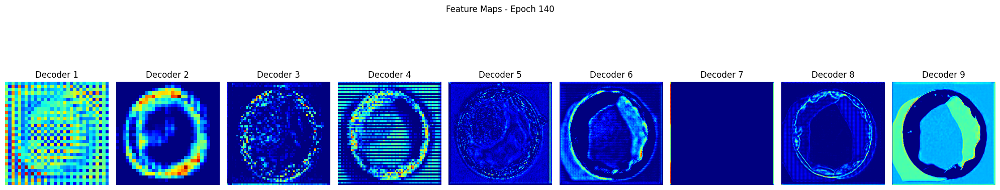

63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9959 - dice_coef: 0.9652 - iou: 0.9658 - loss: 0.0348 - precision: 0.9805 - recall: 0.9848 - val_accuracy: 0.9641 - val_dice_coef: 0.8349 - val_iou: 0.7368 - val_loss: 0.1639 - val_precision: 0.8574 - val_recall: 0.8419 - learning_rate: 1.0000e-04
Epoch 141/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9959 - dice_coef: 0.9659 - iou: 0.9664 - loss: 0.0341 - precision: 0.9817 - recall: 0.9842 - val_accuracy: 0.9635 - val_dice_coef: 0.8339 - val_iou: 0.7343 - val_loss: 0.1644 - val_precision: 0.8477 - val_recall: 0.8493 - learning_rate: 1.0000e-04
Epoch 142/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9957 - dice_coef: 0.9657 - iou: 0.9647 - loss: 0.0343 - precision: 0.9807 - recall: 0.9835 - val_accuracy: 0.9632 - val_dice_coef: 0.8303 - val_iou: 0.7285 - val_loss: 0.1678 - val_precision: 0.8574 - val_recall: 0.8326 - learning_rate: 1.0000e-04
Epoch 143/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 

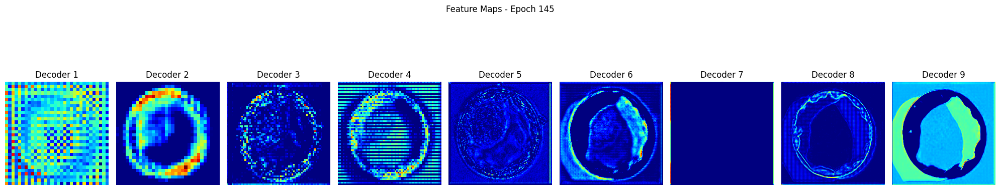

63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9954 - dice_coef: 0.9654 - iou: 0.9615 - loss: 0.0346 - precision: 0.9787 - recall: 0.9821 - val_accuracy: 0.9617 - val_dice_coef: 0.8255 - val_iou: 0.7198 - val_loss: 0.1733 - val_precision: 0.8524 - val_recall: 0.8247 - learning_rate: 1.0000e-04
Epoch 146/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9959 - dice_coef: 0.9679 - iou: 0.9659 - loss: 0.0321 - precision: 0.9812 - recall: 0.9842 - val_accuracy: 0.9633 - val_dice_coef: 0.8322 - val_iou: 0.7292 - val_loss: 0.1654 - val_precision: 0.8545 - val_recall: 0.8375 - learning_rate: 1.0000e-04
Epoch 147/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9959 - dice_coef: 0.9684 - iou: 0.9661 - loss: 0.0316 - precision: 0.9814 - recall: 0.9842 - val_accuracy: 0.9620 - val_dice_coef: 0.8257 - val_iou: 0.7188 - val_loss: 0.1728 - val_precision: 0.8596 - val_recall: 0.8175 - learning_rate: 1.0000e-04
Epoch 148/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.

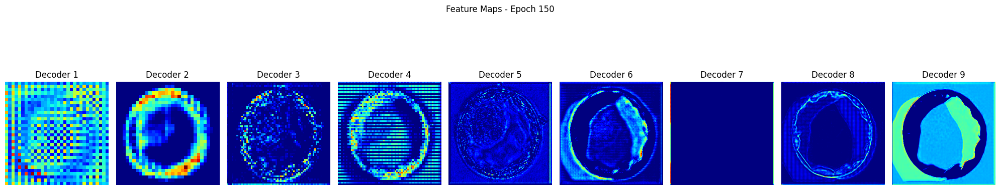

63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9967 - dice_coef: 0.9722 - iou: 0.9725 - loss: 0.0278 - precision: 0.9845 - recall: 0.9876 - val_accuracy: 0.9639 - val_dice_coef: 0.8358 - val_iou: 0.7337 - val_loss: 0.1622 - val_precision: 0.8577 - val_recall: 0.8395 - learning_rate: 1.0000e-05
Epoch 151/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 160s 3s/step - accuracy: 0.9968 - dice_coef: 0.9727 - iou: 0.9736 - loss: 0.0273 - precision: 0.9856 - recall: 0.9877 - val_accuracy: 0.9639 - val_dice_coef: 0.8366 - val_iou: 0.7346 - val_loss: 0.1614 - val_precision: 0.8552 - val_recall: 0.8431 - learning_rate: 1.0000e-05
Epoch 152/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9968 - dice_coef: 0.9726 - iou: 0.9732 - loss: 0.0274 - precision: 0.9856 - recall: 0.9873 - val_accuracy: 0.9639 - val_dice_coef: 0.8361 - val_iou: 0.7339 - val_loss: 0.1619 - val_precision: 0.8564 - val_recall: 0.8411 - learning_rate: 1.0000e-05
Epoch 153/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 160s 3s/step - accuracy: 

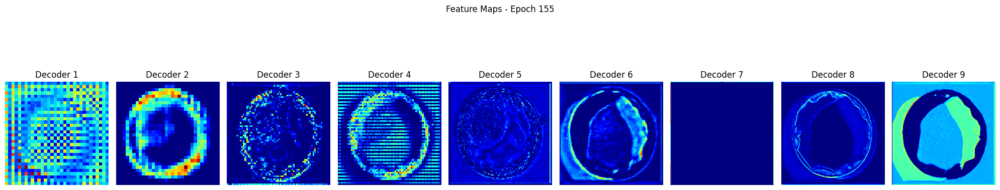

63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9969 - dice_coef: 0.9733 - iou: 0.9745 - loss: 0.0267 - precision: 0.9863 - recall: 0.9879 - val_accuracy: 0.9637 - val_dice_coef: 0.8350 - val_iou: 0.7322 - val_loss: 0.1629 - val_precision: 0.8567 - val_recall: 0.8387 - learning_rate: 1.0000e-05
Epoch 156/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 160s 3s/step - accuracy: 0.9970 - dice_coef: 0.9734 - iou: 0.9747 - loss: 0.0266 - precision: 0.9859 - recall: 0.9885 - val_accuracy: 0.9641 - val_dice_coef: 0.8376 - val_iou: 0.7360 - val_loss: 0.1605 - val_precision: 0.8562 - val_recall: 0.8436 - learning_rate: 1.0000e-05
Epoch 157/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9971 - dice_coef: 0.9739 - iou: 0.9755 - loss: 0.0261 - precision: 0.9866 - recall: 0.9887 - val_accuracy: 0.9641 - val_dice_coef: 0.8373 - val_iou: 0.7355 - val_loss: 0.1608 - val_precision: 0.8566 - val_recall: 0.8425 - learning_rate: 1.0000e-05
Epoch 158/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 160s 3s/step - accuracy: 

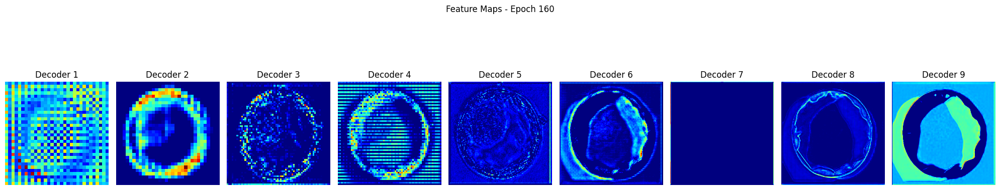

63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9970 - dice_coef: 0.9737 - iou: 0.9749 - loss: 0.0263 - precision: 0.9861 - recall: 0.9886 - val_accuracy: 0.9640 - val_dice_coef: 0.8369 - val_iou: 0.7346 - val_loss: 0.1613 - val_precision: 0.8580 - val_recall: 0.8400 - learning_rate: 1.0000e-05
Epoch 161/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9971 - dice_coef: 0.9743 - iou: 0.9762 - loss: 0.0257 - precision: 0.9868 - recall: 0.9892 - val_accuracy: 0.9644 - val_dice_coef: 0.8396 - val_iou: 0.7388 - val_loss: 0.1589 - val_precision: 0.8549 - val_recall: 0.8478 - learning_rate: 1.0000e-05
Epoch 162/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9971 - dice_coef: 0.9741 - iou: 0.9757 - loss: 0.0259 - precision: 0.9864 - recall: 0.9892 - val_accuracy: 0.9637 - val_dice_coef: 0.8358 - val_iou: 0.7327 - val_loss: 0.1623 - val_precision: 0.8556 - val_recall: 0.8399 - learning_rate: 1.0000e-05
Epoch 163/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 160s 3s/step - accuracy: 

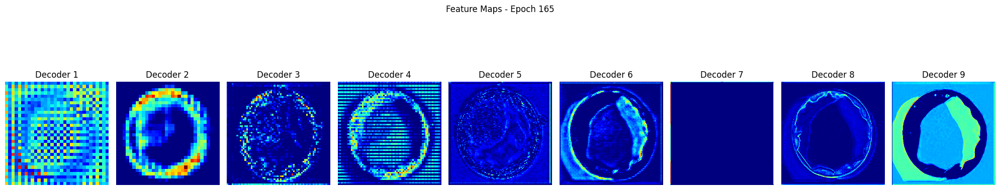

63/63 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.9971 - dice_coef: 0.9743 - iou: 0.9757 - loss: 0.0257 - precision: 0.9870 - recall: 0.9885 - val_accuracy: 0.9641 - val_dice_coef: 0.8384 - val_iou: 0.7364 - val_loss: 0.1599 - val_precision: 0.8554 - val_recall: 0.8448 - learning_rate: 1.0000e-05
Epoch 166/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9972 - dice_coef: 0.9748 - iou: 0.9766 - loss: 0.0251 - precision: 0.9870 - recall: 0.9894 - val_accuracy: 0.9640 - val_dice_coef: 0.8373 - val_iou: 0.7351 - val_loss: 0.1610 - val_precision: 0.8573 - val_recall: 0.8412 - learning_rate: 1.0000e-05
Epoch 167/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9972 - dice_coef: 0.9747 - iou: 0.9764 - loss: 0.0253 - precision: 0.9869 - recall: 0.9893 - val_accuracy: 0.9639 - val_dice_coef: 0.8366 - val_iou: 0.7339 - val_loss: 0.1616 - val_precision: 0.8572 - val_recall: 0.8400 - learning_rate: 1.0000e-05
Epoch 168/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 

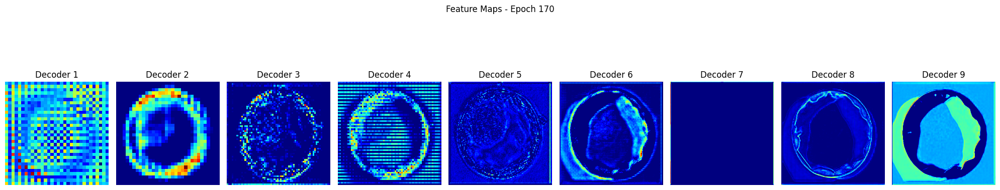

63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9972 - dice_coef: 0.9752 - iou: 0.9771 - loss: 0.0248 - precision: 0.9874 - recall: 0.9896 - val_accuracy: 0.9639 - val_dice_coef: 0.8372 - val_iou: 0.7343 - val_loss: 0.1612 - val_precision: 0.8562 - val_recall: 0.8409 - learning_rate: 1.0000e-05
Epoch 171/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9972 - dice_coef: 0.9749 - iou: 0.9763 - loss: 0.0251 - precision: 0.9870 - recall: 0.9891
Epoch 171: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-07.
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9972 - dice_coef: 0.9749 - iou: 0.9763 - loss: 0.0251 - precision: 0.9870 - recall: 0.9891 - val_accuracy: 0.9641 - val_dice_coef: 0.8382 - val_iou: 0.7362 - val_loss: 0.1600 - val_precision: 0.8559 - val_recall: 0.8440 - learning_rate: 1.0000e-05
Epoch 172/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9973 - dice_coef: 0.9753 - iou: 0.9772 - loss: 0.0247 - precision: 0.9871 - recall: 0.9899 - 

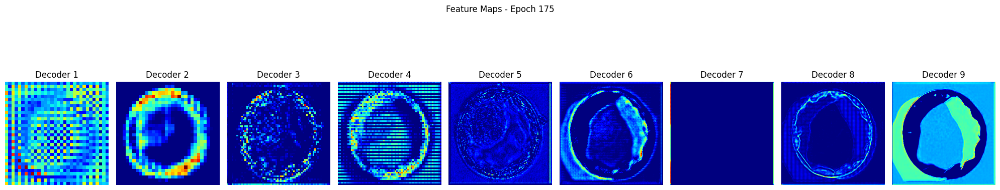

63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9972 - dice_coef: 0.9752 - iou: 0.9769 - loss: 0.0248 - precision: 0.9874 - recall: 0.9892 - val_accuracy: 0.9642 - val_dice_coef: 0.8389 - val_iou: 0.7369 - val_loss: 0.1594 - val_precision: 0.8554 - val_recall: 0.8453 - learning_rate: 1.0000e-06
Epoch 176/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 160s 3s/step - accuracy: 0.9973 - dice_coef: 0.9753 - iou: 0.9773 - loss: 0.0247 - precision: 0.9874 - recall: 0.9898 - val_accuracy: 0.9641 - val_dice_coef: 0.8388 - val_iou: 0.7368 - val_loss: 0.1596 - val_precision: 0.8554 - val_recall: 0.8449 - learning_rate: 1.0000e-06
Epoch 177/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9973 - dice_coef: 0.9755 - iou: 0.9775 - loss: 0.0245 - precision: 0.9876 - recall: 0.9897 - val_accuracy: 0.9641 - val_dice_coef: 0.8386 - val_iou: 0.7365 - val_loss: 0.1597 - val_precision: 0.8555 - val_recall: 0.8445 - learning_rate: 1.0000e-06
Epoch 178/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 160s 3s/step - accuracy: 

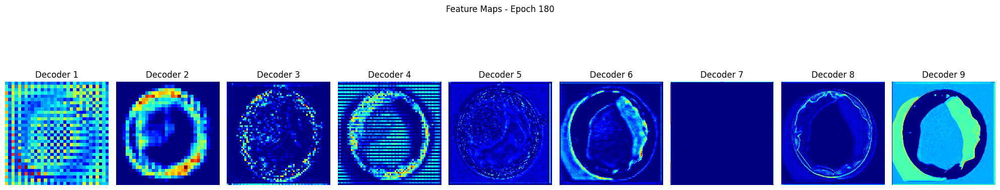

63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9973 - dice_coef: 0.9754 - iou: 0.9773 - loss: 0.0246 - precision: 0.9876 - recall: 0.9895 - val_accuracy: 0.9642 - val_dice_coef: 0.8386 - val_iou: 0.7366 - val_loss: 0.1597 - val_precision: 0.8565 - val_recall: 0.8438 - learning_rate: 1.0000e-06
Epoch 181/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9974 - dice_coef: 0.9759 - iou: 0.9783 - loss: 0.0241 - precision: 0.9878 - recall: 0.9903
Epoch 181: ReduceLROnPlateau reducing learning rate to 1e-07.
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9974 - dice_coef: 0.9759 - iou: 0.9782 - loss: 0.0241 - precision: 0.9878 - recall: 0.9902 - val_accuracy: 0.9642 - val_dice_coef: 0.8384 - val_iou: 0.7363 - val_loss: 0.1598 - val_precision: 0.8566 - val_recall: 0.8435 - learning_rate: 1.0000e-06
Epoch 182/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9972 - dice_coef: 0.9753 - iou: 0.9770 - loss: 0.0247 - precision: 0.9872 - recall: 0.9895 - val_accuracy: 0.

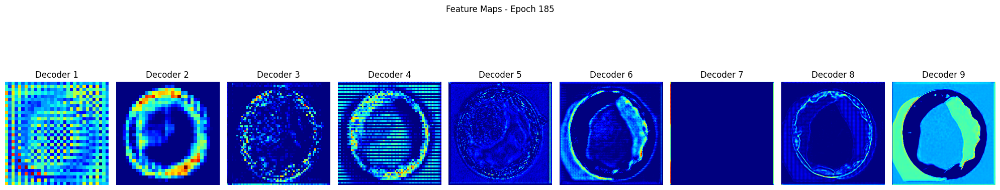

63/63 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.9973 - dice_coef: 0.9756 - iou: 0.9776 - loss: 0.0244 - precision: 0.9876 - recall: 0.9898 - val_accuracy: 0.9641 - val_dice_coef: 0.8382 - val_iou: 0.7360 - val_loss: 0.1600 - val_precision: 0.8566 - val_recall: 0.8429 - learning_rate: 1.0000e-07
Epoch 186/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9973 - dice_coef: 0.9754 - iou: 0.9773 - loss: 0.0246 - precision: 0.9874 - recall: 0.9897 - val_accuracy: 0.9641 - val_dice_coef: 0.8383 - val_iou: 0.7361 - val_loss: 0.1600 - val_precision: 0.8567 - val_recall: 0.8430 - learning_rate: 1.0000e-07
Epoch 187/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9973 - dice_coef: 0.9754 - iou: 0.9774 - loss: 0.0246 - precision: 0.9874 - recall: 0.9897 - val_accuracy: 0.9641 - val_dice_coef: 0.8383 - val_iou: 0.7361 - val_loss: 0.1600 - val_precision: 0.8567 - val_recall: 0.8429 - learning_rate: 1.0000e-07
Epoch 188/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 

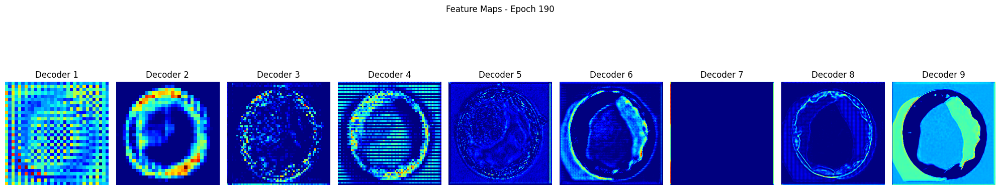

63/63 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.9973 - dice_coef: 0.9753 - iou: 0.9771 - loss: 0.0247 - precision: 0.9871 - recall: 0.9897 - val_accuracy: 0.9641 - val_dice_coef: 0.8381 - val_iou: 0.7358 - val_loss: 0.1601 - val_precision: 0.8567 - val_recall: 0.8427 - learning_rate: 1.0000e-07
Epoch 191/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9971 - dice_coef: 0.9746 - iou: 0.9756 - loss: 0.0254 - precision: 0.9862 - recall: 0.9892 - val_accuracy: 0.9641 - val_dice_coef: 0.8382 - val_iou: 0.7360 - val_loss: 0.1600 - val_precision: 0.8566 - val_recall: 0.8429 - learning_rate: 1.0000e-07
Epoch 192/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9973 - dice_coef: 0.9756 - iou: 0.9777 - loss: 0.0244 - precision: 0.9877 - recall: 0.9898 - val_accuracy: 0.9641 - val_dice_coef: 0.8380 - val_iou: 0.7356 - val_loss: 0.1602 - val_precision: 0.8566 - val_recall: 0.8424 - learning_rate: 1.0000e-07
Epoch 193/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 

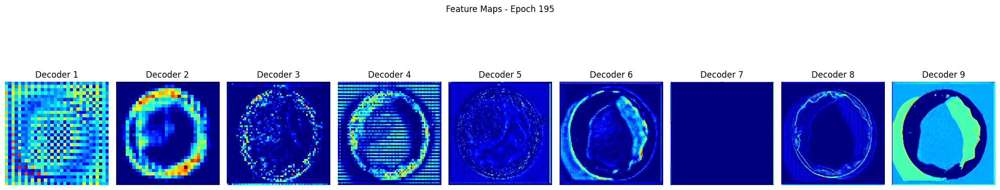

63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9973 - dice_coef: 0.9755 - iou: 0.9774 - loss: 0.0245 - precision: 0.9878 - recall: 0.9894 - val_accuracy: 0.9641 - val_dice_coef: 0.8382 - val_iou: 0.7360 - val_loss: 0.1600 - val_precision: 0.8565 - val_recall: 0.8430 - learning_rate: 1.0000e-07
Epoch 196/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9973 - dice_coef: 0.9753 - iou: 0.9772 - loss: 0.0247 - precision: 0.9875 - recall: 0.9895 - val_accuracy: 0.9641 - val_dice_coef: 0.8383 - val_iou: 0.7361 - val_loss: 0.1599 - val_precision: 0.8566 - val_recall: 0.8430 - learning_rate: 1.0000e-07
Epoch 197/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 0.9973 - dice_coef: 0.9754 - iou: 0.9773 - loss: 0.0246 - precision: 0.9876 - recall: 0.9895 - val_accuracy: 0.9641 - val_dice_coef: 0.8380 - val_iou: 0.7356 - val_loss: 0.1602 - val_precision: 0.8569 - val_recall: 0.8422 - learning_rate: 1.0000e-07
Epoch 198/200
63/63 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - accuracy: 

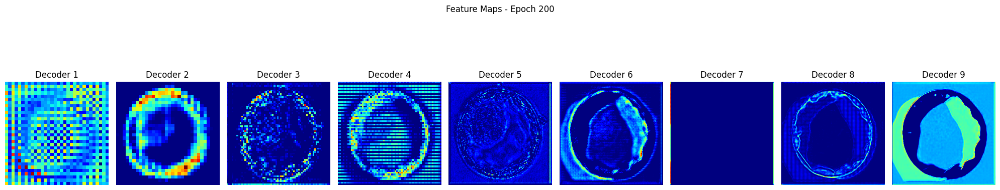

63/63 ━━━━━━━━━━━━━━━━━━━━ 162s 3s/step - accuracy: 0.9974 - dice_coef: 0.9756 - iou: 0.9778 - loss: 0.0244 - precision: 0.9877 - recall: 0.9900 - val_accuracy: 0.9641 - val_dice_coef: 0.8381 - val_iou: 0.7359 - val_loss: 0.1601 - val_precision: 0.8570 - val_recall: 0.8424 - learning_rate: 1.0000e-07


In [26]:
modelte_totale.fit(
    train_dataset,
    validation_data=valid_dataset,
    epochs=200,
    callbacks=[callbacks,feature_map_callback],
)

In [30]:
modelte_totale.evaluate(test_dataset)

2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 551ms/step - accuracy: 0.9662 - dice_coef: 0.8530 - iou: 0.7590 - loss: 0.1487 - precision: 0.8904 - recall: 0.8332


[0.14644740521907806,
 0.8562049865722656,
 0.7641849517822266,
 0.9671453833580017,
 0.8369317650794983,
 0.8908770084381104]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


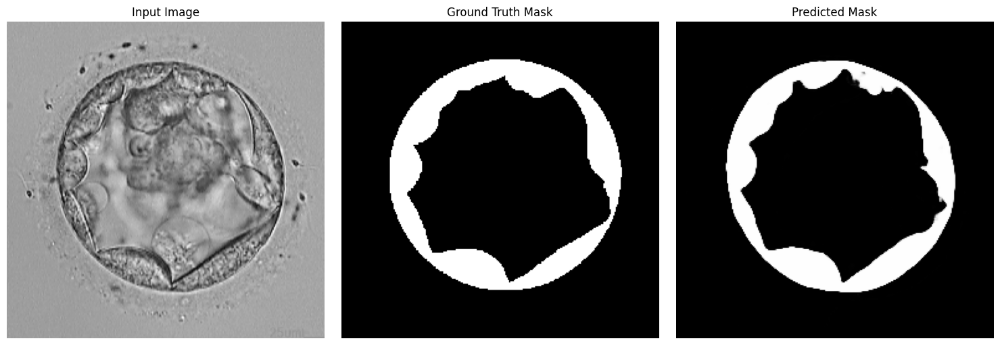

In [34]:

pred_dict = modelte_totale.predict(sample_img_exp)
output = pred_dict[0]  # (H, W, 1)

# Plotting
plt.figure(figsize=(15, 5))

# Input image
plt.subplot(1, 3, 1)
plt.imshow(sample_img)
plt.title("Input Image")
plt.axis('off')

# Ground truth mask
plt.subplot(1, 3, 2)
plt.imshow(sample_mask[..., 0] if sample_mask.ndim == 3 else sample_mask, cmap='gray')
plt.title("Ground Truth Mask")
plt.axis('off')

# Predicted mask
plt.subplot(1, 3, 3)
plt.imshow(output[..., 0], cmap='gray')
plt.title("Predicted Mask")
plt.axis('off')

plt.tight_layout()
plt.show()
